# Fine-Grained Classification of Sneakers Using Pretrained CNNs: Phase 1

## Introduction

In this phase of the project, we aim to harness the power of pretrained convolutional neural networks (CNNs) to classify sneakers by brand and model. This task focuses on fine-grained distinctions within a diverse dataset of sneaker images, setting the foundation for advanced classification and authentication tasks in subsequent phases.

> **Note on Contributions:**  
This project was independently completed by **Shaimon Rahman**.  
All code, image preprocessing, model training, and documentation in Phase 1 were done solely by me.

---

## Objectives

- Implement and fine-tune pretrained CNN models for high-accuracy sneaker classification.
- Evaluate model performance on a meticulously curated dataset, split into training, validation, and testing sets.

## Approach

- **Dataset Preparation**: Collect images from various sources, ensuring a wide representation of sneaker brands and models.
- **Model Selection**: Utilize established CNN architectures to learn and predict fine-grained features of sneakers.
- **Performance Evaluation**: Analyze the effectiveness of each model, focusing on their strengths and limitations in classifying fine details.



## Dataset Collection and Preparation

### Overview

The dataset for this project consists of images across 21 distinct sneaker categories, each representing a specific brand and model (e.g., Nike Air Max 90). A minimum of 25 photos have been collected for each category, ensuring a robust dataset for training our models.


### Sources and Collection Method

- **Social Media**: A significant portion of our images was sourced from social media platforms, where sneaker enthusiasts and retailers frequently showcase various sneaker models.
- **Direct Photography**: To enhance the diversity of the dataset and capture unique perspectives, we also contributed our own photos of sneakers. This allowed us to include angles and details that are often missing in standard online images.

> **Copyright Assurance**: We have made every effort to ensure that none of the images used in this dataset are subject to copyright restrictions. Where possible, we selected publicly shared or self-captured images to avoid any potential infringement.

### Organization and Accuracy

To maintain high labeling accuracy and streamline the data preparation process:

- **Folder Structure**: Each sneaker category was stored in a dedicated folder named after its brand and model. This organization allowed for automatic label assignment during training using image generators.
- **Immediate Storage**: All images were saved directly into their corresponding folders immediately upon collection, minimizing labeling errors and ensuring consistency throughout the dataset.



## Initial Setup

We start by setting up our environment and preparing the dataset:

- **Library Imports**: Load the necessary libraries for image processing and model training.
- **GPU Check**: Verify GPU availability to ensure optimal performance.


In [5]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import splitfolders

# Check GPU availability
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


ModuleNotFoundError: No module named 'matplotlib'

## Image Format Standardization

To ensure consistency across our dataset, we convert all images to JPEG format and rename them according to their respective class and sequence. This standardization is crucial for uniform data input during model training.


In [2]:
import os
import glob
from PIL import Image
import shutil

def convert_and_rename_images(directory):
    """Convert all images in the directory to JPEG and rename them sequentially, using a temporary directory to avoid conflicts."""
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            temp_folder_path = os.path.join(folder_path, 'temp')
            os.makedirs(temp_folder_path, exist_ok=True)  # Create a temporary directory
            images = sorted(glob.glob(folder_path + '/*.*'))  # Get all files and sort them

            for i, img_path in enumerate(images):
                if img_path.endswith('temp'):  # Skip the temp directory itself
                    continue
                new_filename = f"{folder}_{i+1}.jpg"
                temp_path = os.path.join(temp_folder_path, new_filename)  # Save in temp directory first

                try:
                    with Image.open(img_path) as img:
                        img = img.convert('RGB')  # Convert to RGB for JPEG
                        img.save(temp_path, 'JPEG')  # Save as JPEG in temp folder
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")

            # Once all files are processed, remove original images and move new ones back to the main directory
            for img_path in images:
                if img_path.endswith('temp'):  # Skip the temp directory itself
                    continue
                os.remove(img_path)  # Remove original file

            # Move all new files from temp to the main directory
            for temp_file in os.listdir(temp_folder_path):
                shutil.move(os.path.join(temp_folder_path, temp_file), folder_path)

            # Remove the temporary directory
            os.rmdir(temp_folder_path)

# Specify the base directory where images are stored
base_dir = '/Users/shaimonrahman/Desktop/COMP8430/Group Project/Data'

# Run the conversion and renaming function on the dataset directory
convert_and_rename_images(base_dir)


## Data Preparation and Splitting

Next, we'll prepare our dataset. This includes splitting the images into training, validation, and testing sets while maintaining a proportional representation for each category in these splits.


In [3]:
# Splitting the dataset into training, validation, and testing folders
output_folder = '/Users/shaimonrahman/Desktop/COMP8430/Group Project/Data_split'
splitfolders.ratio(base_dir, output=output_folder, seed=42, ratio=(.6, .1, .3))

# Paths to the split directories
train_dir = os.path.join(output_folder, 'train')
val_dir = os.path.join(output_folder, 'val')
test_dir = os.path.join(output_folder, 'test')

# Image specifications
img_height, img_width = 224, 224  # Size to which each image is resized
batch_size = 32  # Number of images to process in a batch

# Data generators with rescaling
datagen = ImageDataGenerator(rescale=1./255)

# Creating data generators
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True  # Shuffling for the training data
)

# Validation data generator (no augmentation, only rescaling)
validation_generator = datagen.flow_from_directory(
    val_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # No shuffling for validation data
)

# Test data generator (no augmentation, only rescaling)
test_generator = datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # No shuffling for test data
)

Copying files: 780 files [00:00, 1815.84 files/s]

Found 458 images belonging to 21 classes.
Found 68 images belonging to 21 classes.
Found 254 images belonging to 21 classes.


In [4]:
# Function to check the number of images per category in a directory
def check_images_per_category(directory):
    categories = os.listdir(directory)
    for category in categories:
        category_path = os.path.join(directory, category)
        num_images = len(os.listdir(category_path))
        print(f"Category: {category}, Number of Images: {num_images}")

# Check images in training, validation, and test sets
print("\nTraining Data:\n")
check_images_per_category(train_dir)

print("\nValidation Data:\n")
check_images_per_category(val_dir)

print("\nTesting Data:\n")
check_images_per_category(test_dir)



Training Data:

Category: Nike_Vomero_17, Number of Images: 23
Category: Adidas_Supernova_Rise_2, Number of Images: 16
Category: Nike_Dunk_Low_Retro, Number of Images: 16
Category: Nike_Air_Max_270, Number of Images: 16
Category: Nike_Winflo_10, Number of Images: 27
Category: Adidas_Adios_Pro_4, Number of Images: 19
Category: Asics_Gel_Kayano_31, Number of Images: 18
Category: Hoka_Rincon_4, Number of Images: 27
Category: Hoka_Bondi_8, Number of Images: 18
Category: Adidas_Ultraboost_5, Number of Images: 22
Category: Nike_Infinity_RN_4, Number of Images: 16
Category: Nike_Alphafly_3, Number of Images: 16
Category: Nike_Free_Metcon_6, Number of Images: 26
Category: Nike_Air_Zoom_Pegasus_38, Number of Images: 18
Category: Nike_Vaporfly_4, Number of Images: 27
Category: Hoka_Clifton_9, Number of Images: 36
Category: Asics_Gel_Nimbus_26, Number of Images: 25
Category: Nike_Infinity_React_3, Number of Images: 26
Category: Nike_Air_Max_90, Number of Images: 16
Category: Asics_GT_2000_11, Nu

## Dataset Split Overview

After preparing our dataset, we have divided the images into training, validation, and testing sets. This split ensures a balanced representation across various sneaker models, facilitating effective model training and robust evaluation. Here are the details of the dataset distribution:

### Training Set
The training set comprises a total of 458 images distributed among 21 categories, ensuring diverse exposure to different sneaker models during the training process.

### Validation Set
The validation set includes 68 images across 21 categories, used to fine-tune the parameters and prevent overfitting of the model.

### Testing Set
The testing set consists of 254 images and serves to evaluate the model's performance on new, unseen data, providing an unbiased assessment of its generalization capability.

This strategic split supports effective training and validation, paving the way for accurate and reliable model performance evaluations.


## Sample Images from the Training Set

To visually inspect the diversity and quality of images in our training set, the following visualization presents sample images from each category. This helps to confirm that the dataset contains a varied representation of sneaker models, ensuring that the training process encompasses a broad spectrum of the data.


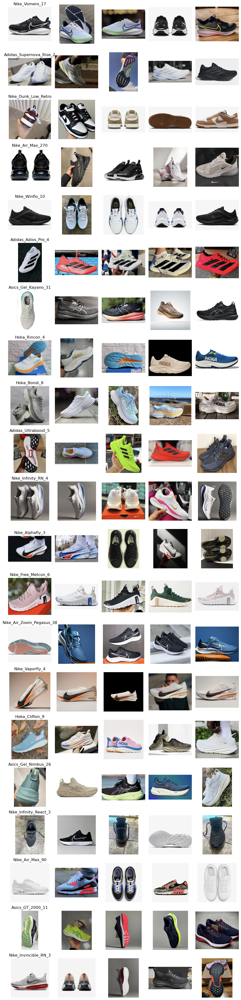

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_sample_images(directory, num_samples=5):
    categories = os.listdir(directory)
    fig, axes = plt.subplots(len(categories), num_samples, figsize=(num_samples * 2, len(categories) * 2))
    for i, category in enumerate(categories):
        images = os.listdir(os.path.join(directory, category))[:num_samples]
        for j, image in enumerate(images):
            img_path = os.path.join(directory, category, image)
            img = mpimg.imread(img_path)
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(category)
    plt.tight_layout()
    plt.show()

# Show sample images from the training set
show_sample_images(train_dir)


## Dual Model Configuration

In this section, we configure two popular pre-trained models, InceptionV3 and MobileNetV2, to tackle our sneaker classification problem. Both models are loaded with their pre-trained weights on ImageNet and modified by adding custom layers tailored to our specific classification task of 21 classes. The base layers of each model are frozen to leverage learned features while the new custom layers will be fine-tuned to our sneaker dataset.


In [6]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load InceptionV3 pretrained model
inceptionv3_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the layers of the InceptionV3 base model to avoid updating them during training
for layer in inceptionv3_base.layers:
    layer.trainable = False

# Create custom layers on top of InceptionV3
x_inception = Flatten()(inceptionv3_base.output)  # Flatten the output of InceptionV3
x_inception = Dense(512, activation='relu')(x_inception)  # Add a fully connected layer
x_inception = Dropout(0.5)(x_inception)  # Dropout to prevent overfitting
inceptionv3_predictions = Dense(21, activation='softmax')(x_inception)

# Create the complete InceptionV3 model
inceptionv3_model = Model(inputs=inceptionv3_base.input, outputs=inceptionv3_predictions)

# Compile the InceptionV3 model
inceptionv3_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

print("\nInceptionV3 Model Summary:")
inceptionv3_model.summary()



InceptionV3 Model Summary:


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 48,028,469 (183.21 MB)

 Trainable params: 26,225,685 (100.04 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [26]:
from tensorflow.keras.applications import MobileNetV2

# Load MobileNetV2 pretrained model
mobilenetv2_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the layers of the MobileNetV2 base model
for layer in mobilenetv2_base.layers:
    layer.trainable = False

# Create custom layers on top of MobileNetV2
x_mobilenet = Flatten()(mobilenetv2_base.output)  # Flatten the output of MobileNetV2
x_mobilenet = Dense(512, activation='relu')(x_mobilenet)  # Add a fully connected layer
x_mobilenet = Dropout(0.5)(x_mobilenet)  # Dropout to prevent overfitting
mobilenetv2_predictions = Dense(21, activation='softmax')(x_mobilenet)

# Create the complete MobileNetV2 model
mobilenetv2_model = Model(inputs=mobilenetv2_base.input, outputs=mobilenetv2_predictions)

# Compile the MobileNetV2 model
mobilenetv2_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
print("\MobileNetV2 Model Summary:")
mobilenetv2_model.summary()


\MobileNetV2 Model Summary:


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 34,381,909 (131.16 MB)

 Trainable params: 32,123,925 (122.54 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

## Training the Models with Early Stopping

We implement early stopping to halt training when the validation loss ceases to decrease, preventing overfitting and saving computational resources. The training will stop after `patience` number of epochs have passed without improvement in validation loss.


In [8]:
from tensorflow.keras.callbacks import EarlyStopping

# Set up the early stopping to monitor 'val_loss' and stop training after 5 epochs of no improvements
early_stopping = EarlyStopping(monitor='val_loss', patience=5, min_delta=0.01, verbose=1, restore_best_weights=True)


In [9]:
# Train the InceptionV3 model
inceptionv3_history = inceptionv3_model.fit(
    train_generator,
    epochs=30,  # Number of epochs
    validation_data=validation_generator,
    callbacks=[early_stopping],  # Using early stopping to avoid overfitting
    verbose=1
)


Epoch 1/30


/Users/shaimonrahman/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


15/15 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.0694 - loss: 5.2689 - val_accuracy: 0.1324 - val_loss: 3.0822
Epoch 2/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.3612 - loss: 2.3345 - val_accuracy: 0.2500 - val_loss: 2.6120
Epoch 3/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.5343 - loss: 1.5861 - val_accuracy: 0.2500 - val_loss: 2.5899
Epoch 4/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.6580 - loss: 1.2147 - val_accuracy: 0.3088 - val_loss: 2.4629
Epoch 5/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.7665 - loss: 0.7972 - val_accuracy: 0.3088 - val_loss: 2.3379
Epoch 6/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.8698 - loss: 0.5552 - val_accuracy: 0.2647 - val_loss: 2.3097
Epoch 7/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9165 - loss: 0.3783 - val_accuracy: 0.3088 - val_loss: 2.2040
Epoch 8/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9094 - loss: 0.3603 - val_accuracy: 0.3676 - val_loss: 2.2077
Epo

## InceptionV3 Training Summary

We trained the InceptionV3 model on a sneaker classification task over 30 epochs, using early stopping to prevent overfitting based on validation performance.

### Key Results:
- **Total Epochs Run**: 26 (early stopped)
- **Best Epoch (Restored)**: 21
- **Highest Validation Accuracy**: 45.59% at Epoch 26
- **Lowest Validation Loss**: 2.0934 at Epoch 21
- **Final Training Accuracy**: 100% at Epochs 19 and 24
- **Final Validation Accuracy**: 45.59% at Epoch 26


In [10]:
# Train the Mobilenetv2 model
mobilenetv2_history = mobilenetv2_model.fit(
    train_generator,
    epochs=30,  # Number of epochs
    validation_data=validation_generator,
    callbacks=[early_stopping],  # Using early stopping to avoid overfitting
    verbose=1
)

Epoch 1/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 17s 840ms/step - accuracy: 0.1162 - loss: 4.8255 - val_accuracy: 0.3235 - val_loss: 2.3723
Epoch 2/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 685ms/step - accuracy: 0.6600 - loss: 1.1686 - val_accuracy: 0.4412 - val_loss: 1.9506
Epoch 3/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 720ms/step - accuracy: 0.8778 - loss: 0.4500 - val_accuracy: 0.5147 - val_loss: 1.6689
Epoch 4/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 694ms/step - accuracy: 0.9777 - loss: 0.1612 - val_accuracy: 0.5441 - val_loss: 1.5773
Epoch 5/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 716ms/step - accuracy: 0.9868 - loss: 0.1019 - val_accuracy: 0.4853 - val_loss: 1.5827
Epoch 6/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 716ms/step - accuracy: 0.9928 - loss: 0.0608 - val_accuracy: 0.5147 - val_loss: 1.4742
Epoch 7/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 12s 673ms/step - accuracy: 0.9953 - loss: 0.0461 - val_accuracy: 0.5147 - val_loss: 1.5487
Epoch 8/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 12s 690ms/step - accuracy: 0.9986 - loss: 0.0224 - val_accu

## MobileNetV2 Training Summary

The MobileNetV2 model was trained for a sneaker classification task. Early stopping was utilized to halt training after validation performance plateaued.

### Key Results:
- **Total Epochs Run**: 16 (early stopped)
- **Best Epoch (Restored)**: 11
- **Highest Validation Accuracy**: 64.71% at Epoch 10
- **Lowest Validation Loss**: 1.3081 at Epoch 11
- **Final Training Accuracy**: 100% at Epochs 10 and 11
- **Final Validation Accuracy**: 57.35% at Epoch 16


In [11]:
# Evaluate the InceptionV3 model on the test set
inceptionv3_test_loss, inceptionv3_test_acc = inceptionv3_model.evaluate(test_generator)
print(f"InceptionV3 Test Accuracy: {inceptionv3_test_acc*100:.2f}%")
print(f"InceptionV3 Test Loss: {inceptionv3_test_loss:.4f}")

# Evaluate the MobileNetV2 model on the test set
mobilenetv2_test_loss, mobilenetv2_test_acc = mobilenetv2_model.evaluate(test_generator)
print(f"MobileNetV2 Test Accuracy: {mobilenetv2_test_acc*100:.2f}%")
print(f"MobileNetV2 Test Loss: {mobilenetv2_test_loss:.4f}")


8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.6212 - loss: 1.4095
InceptionV3 Test Accuracy: 56.30%
InceptionV3 Test Loss: 1.6385
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 637ms/step - accuracy: 0.6005 - loss: 1.3155
MobileNetV2 Test Accuracy: 57.87%
MobileNetV2 Test Loss: 1.4475


## Testing Results Summary

After training, both models were evaluated on the test dataset to measure their performance in classifying sneaker images.

### InceptionV3 Model:
- **Test Accuracy**: 56.30%
- **Test Loss**: 1.6385

### MobileNetV2 Model:
- **Test Accuracy**: 57.87%
- **Test Loss**: 1.4475

### Model Comparison:

| Metric          | InceptionV3     | MobileNetV2    |
|-----------------|------------------|------------------|
| Test Accuracy   | 56.30%           | **57.87%**       |
| Test Loss       | 1.6385           | **1.4475**       |
| Model Size      | Larger (heavier) | Smaller (lighter) |
| Inference Speed | Slower           | **Faster**        |

**Summary**:  
While both models performed comparably, **MobileNetV2** achieved slightly higher test accuracy and lower test loss, making it the better choice for this sneaker classification task. Additionally, due to its lightweight architecture, MobileNetV2 offers faster inference and is more suitable for deployment on edge devices or mobile platforms. In contrast, InceptionV3 may still be preferred for applications where higher model complexity can be leveraged with more computational resources.


8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 740ms/step


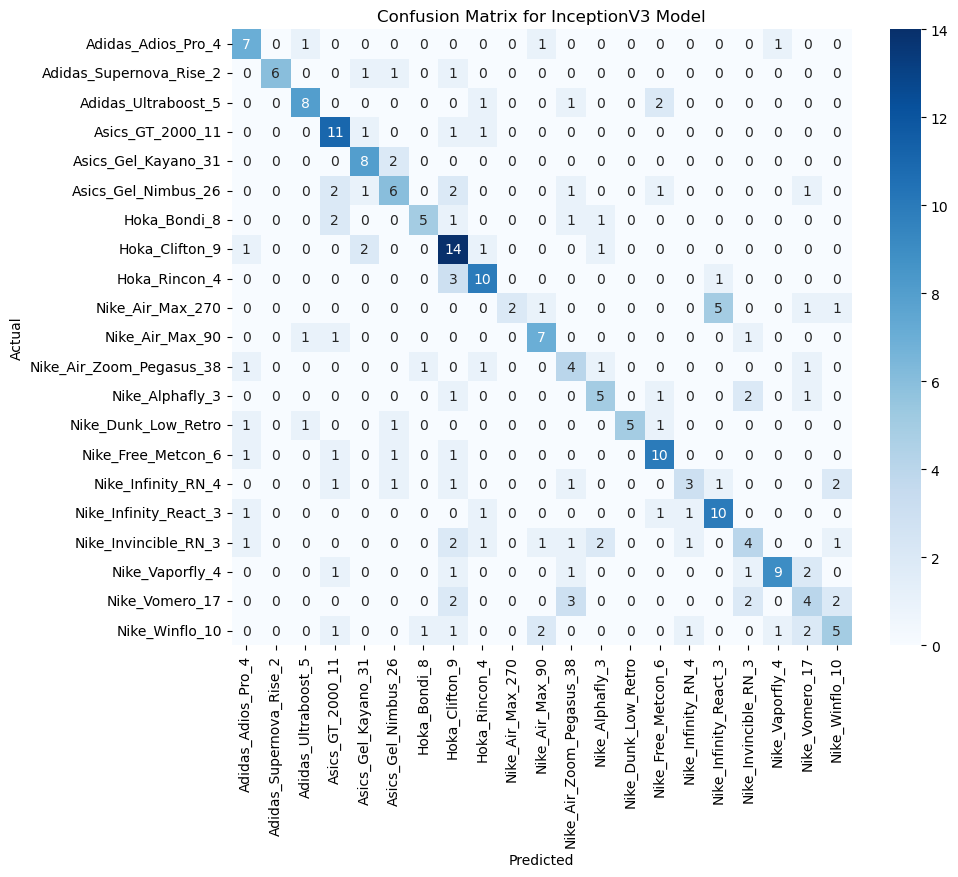

In [12]:
# Confusion matrix and misclassification visualization for InceptionV3
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get class labels from the generator
def get_class_labels(generator):
    return list(generator.class_indices.keys())

# Function to plot the confusion matrix
def plot_confusion_matrix(cm, class_names, title='Confusion Matrix'):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title(title)
    plt.show()

# Extract test labels and predict using InceptionV3 model
test_labels = test_generator.classes
predictions_inception = inceptionv3_model.predict(test_generator)
cm_inception = confusion_matrix(test_labels, np.argmax(predictions_inception, axis=1))
class_names = get_class_labels(test_generator)

# Plot the confusion matrix for InceptionV3
plot_confusion_matrix(cm_inception, class_names, title='Confusion Matrix for InceptionV3 Model')


### InceptionV3 Model Performance Analysis with Confusion Matrix

The confusion matrix for the InceptionV3 model provides an in-depth view of its sneaker classification performance across various categories. Here are the key observations:

- **Strong Class Performance**:
  - `Hoka_Clifton_9` and `Asics_GT_2000_11` show high classification accuracy with 14 and 11 correct predictions respectively, indicating that the model has learned to distinguish them well. This could be due to distinctive features or stronger representation in the training data.

- **Confusion Among Visually Similar Models**:
  - There is evident confusion among similar-looking models from the same brand. For instance, misclassifications occur between:
    - `Nike_Air_Max_270` and `Nike_Infinity_React_3`
    - `Nike_Vomero_17` and `Nike_Air_Zoom_Pegasas_38`
  - These patterns suggest difficulty in distinguishing subtle design differences, especially among Nike's running lines.

- **Moderate-to-High Performance with Room for Improvement**:
  - Models such as `Asics_GT_2000_11`, `Asics_Gel_Kayano_31`, and `Hoka_Rincon_4` have decent correct classification counts but still suffer from occasional mislabeling.

- **Struggles with Certain Classes**:
  - `Nike_Infinity_RN_4` and `Nike_Air_Max_270` were frequently misclassified, with true positives being low and multiple predictions scattered across other classes.
  - `Nike_Alphafly_3` also shows significant confusion with visually similar Nike models.

- **Possible Data Imbalance Effects**:
  - The relatively strong performance on a few classes and weak performance on others may indicate a class imbalance in the training data.
  - Underrepresented classes likely lacked enough diverse examples for the model to generalize properly.

This analysis reinforces the importance of both data quality and quantity in achieving strong classification performance in fine-grained visual tasks like sneaker recognition.



8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 329ms/step


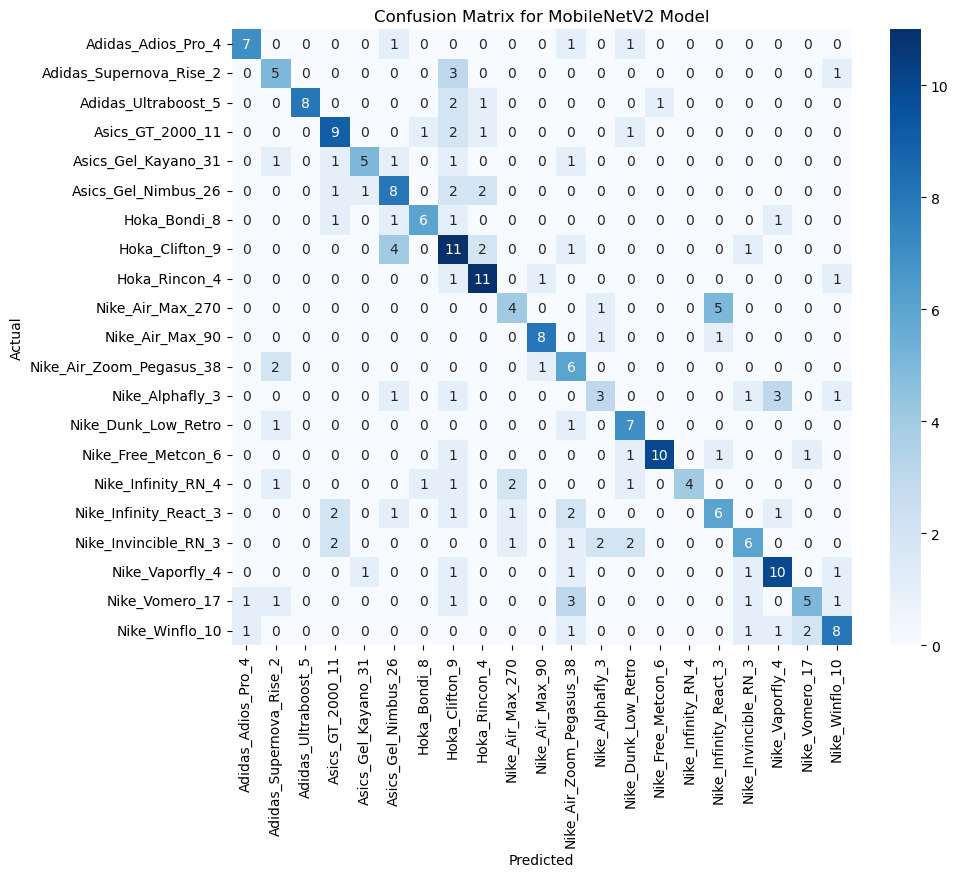

In [13]:
# Confusion matrix and misclassification visualization for MobileNetV2
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Function to plot the confusion matrix
def plot_confusion_matrix(cm, class_names, title='Confusion Matrix'):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title(title)
    plt.show()

# Predict using MobileNetV2 model
predictions_mobilenet = mobilenetv2_model.predict(test_generator)
cm_mobilenet = confusion_matrix(test_labels, np.argmax(predictions_mobilenet, axis=1))

# Plot the confusion matrix for MobileNetV2
plot_confusion_matrix(cm_mobilenet, class_names, title='Confusion Matrix for MobileNetV2 Model')


### MobileNetV2 Model Performance Analysis with Confusion Matrix

The confusion matrix for the MobileNetV2 model reflects its classification performance across a variety of sneaker models. Here are the key insights:

- **Strong Class Performance**:
  - `Hoka_Rincon_4`, `Nike_Vaporfly_4`, and `Nike_Free_Metcon_6` show solid correct predictions with 11, 10, and 10 true positives respectively. This suggests the model has learned to identify key features of these classes reliably.
  - `Asics_GT_2000_11` and `Nike_Air_max_90` also show relatively high accuracy, likely benefiting from both class distinction and sufficient data.

- **Common Confusions Among Similar Models**:
  - There’s notable confusion between `Nike_Vomero_17` with `Nike_Air_Zoom_Pegasas_38`, and between `Nike_Winflo_10` with other Nike models, which are likely visually similar.

- **Cross-Class and Cross-Brand Misclassification**:
  - Some cross-brand confusions still occur, such as between `Hoka` and `Asics` models (e.g., `Hoka_Clifton_9` sometimes misclassified as `Asics_Gel_Nimbus_26`). These cases show the model may struggle to capture brand-specific cues in some cases.

- **Impact of Data Imbalance**:
  - Classes like `Nike_Alphafly_3`, `Nike_Infinity_RN_4`, and `Adidas_Supernova_Rise_2` show lower correct prediction counts and higher misclassification rates, likely due to underrepresentation in training data.
  - Misclassifications spread across many classes indicate the model's uncertainty when handling underrepresented examples.

This analysis indicates that MobileNetV2 is a strong performer with efficient learning, but further improvements in training data balance and model refinement can enhance its accuracy, especially for fine-grained sneaker classification tasks.


In [21]:
import numpy as np
import matplotlib.pyplot as plt
import random

# Extract all test images and labels once from the generator
def extract_test_data(test_gen):
    images = []
    labels = []
    test_gen.reset()
    for _ in range(len(test_gen)):
        batch_images, batch_labels = next(test_gen)
        images.extend(batch_images)
        labels.extend(np.argmax(batch_labels, axis=1))  # Convert one-hot to index
    return np.array(images), np.array(labels)

#Plot a few misclassified images using stored arrays
def plot_misclassified_per_class(images, true_labels, pred_labels, class_names, num_classes=5, model_name=""):
    misclassified_indices = np.where(pred_labels != true_labels)[0]
    random.shuffle(misclassified_indices)  # Shuffle to ensure randomness

    selected_classes = set()
    selected_indices = []

    for idx in misclassified_indices:
        true_class = true_labels[idx]
        if true_class not in selected_classes:
            selected_classes.add(true_class)
            selected_indices.append(idx)
        if len(selected_indices) == num_classes:
            break

    plt.figure(figsize=(18, 6))
    for i, idx in enumerate(selected_indices):
        plt.subplot(1, num_classes, i + 1)
        plt.imshow(images[idx])
        plt.title(f"True: {class_names[true_labels[idx]]}\nPred: {class_names[pred_labels[idx]]}", fontsize=10)
        plt.axis('off')

    plt.suptitle(f"One Misclassified Image from {num_classes} Classes\nModel: {model_name}", fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

# Extract test images and true labels
test_images, test_true_labels = extract_test_data(test_generator)

pred_labels_inception = np.argmax(predictions_inception, axis=1)
pred_labels_mobilenet = np.argmax(predictions_mobilenet, axis=1)


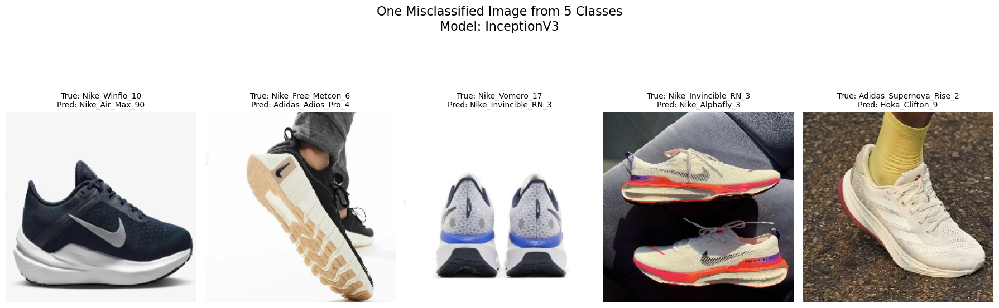

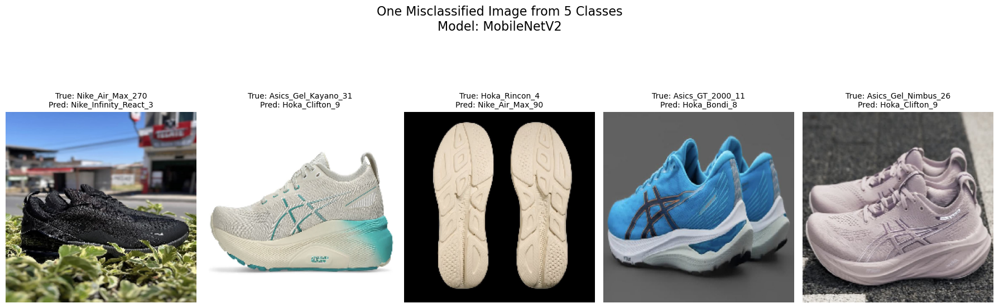

In [22]:
plot_misclassified_per_class(test_images, test_true_labels, pred_labels_inception, class_names, model_name="InceptionV3")
plot_misclassified_per_class(test_images, test_true_labels, pred_labels_mobilenet, class_names, model_name="MobileNetV2")


### Misclassified Image Analysis (First Run)

#### InceptionV3 Model
The InceptionV3 model exhibited several misclassifications spanning both **intra-brand** and **inter-brand** sneaker models. Key observations include:

- `Nike_Winflo_10` was misclassified as `Nike_Air_Max_90`, showing confusion within the same brand, likely due to similar silhouette and color scheme.
- `Nike_Free_Metcon_6` was mistaken for `Adidas_Adios_Pro_4`, a clear example of **cross-brand confusion**.
- `Nike_Vomero_17` was misclassified as `Nike_Invincible_RN_3`, suggesting challenges with visually overlapping Nike running shoes.
- `Nike_Invincible_RN_3` was predicted as `Nike_Alphafly_3`, again highlighting confusion among high-performance models in Nike’s lineup.
- `Adidas_Supernova_Rise_2` was incorrectly identified as `Hoka_Clifton_9`, indicating misalignment across very different brands — potentially caused by visual similarities in mesh textures and midsole designs.

#### MobileNetV2 Model
MobileNetV2 showed a slightly different misclassification pattern, yet still struggled with brand and model-level distinctions:

- `Nike_Air_Max_270` was classified as `Nike_Infinity_React_3`, reflecting difficulties distinguishing between lifestyle and performance silhouettes within Nike.
- `Asics_Gel_Kayano_31` and `Asics_Gel_Nimbus_26` were both predicted as `Hoka_Clifton_9`, highlighting **inter-brand confusion** where midsoles and cushioning systems may appear similar.
- `Hoka_Rincon_4` was misclassified as `Nike_Air_Max_90`, again suggesting overlap in features like outsole patterns or color palettes.
- `Asics_GT_2000_11` was mistaken for `Hoka_Bondi_8`, and `Asics_Gel_Nimbus_26` was confused with `Hoka_Clifton_9`, reinforcing the notion that **chunky midsoles and neutral tones** are a common source of error.


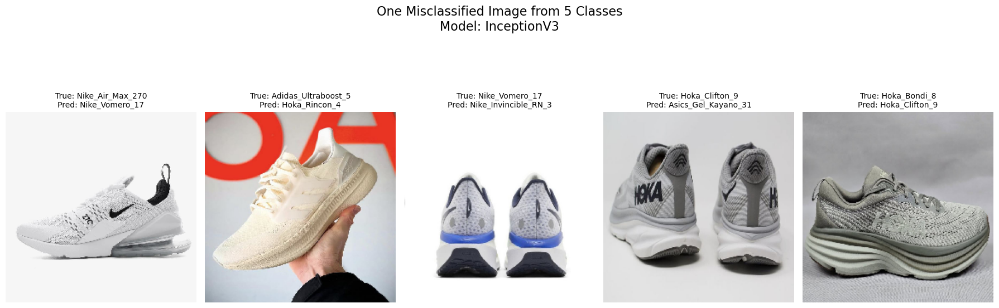

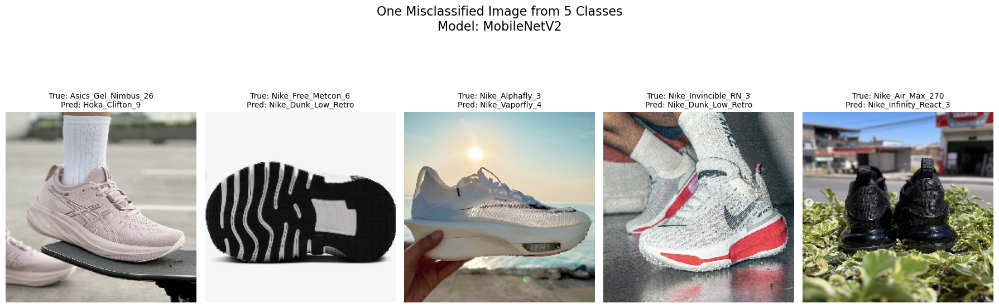

In [23]:
plot_misclassified_per_class(test_images, test_true_labels, pred_labels_inception, class_names, model_name="InceptionV3")
plot_misclassified_per_class(test_images, test_true_labels, pred_labels_mobilenet, class_names, model_name="MobileNetV2")


### Misclassified Image Analysis (Second Run)

#### InceptionV3 Model
The InceptionV3 model misclassified several sneaker images, with clear evidence of both **intra-brand** and **cross-brand** confusion. Key insights include:

- `Nike_Air_Max_270` was incorrectly classified as `Nike_Vomero_17`, which are both Nike models, suggesting **intra-brand confusion** due to similar silhouettes and mesh textures.
- `Adidas_Ultraboost_5` was misclassified as `Hoka_Rincon_4`, highlighting significant **cross-brand confusion**, likely influenced by the soft knit upper and rounded sole design.
- `Nike_Vomero_17` was predicted as `Nike_Invincible_RN_3`, showing challenges distinguishing between **similar Nike performance runners**.
- `Hoka_Clifton_9` was confused with `Asics_Gel_Kayano_31`, and `Hoka_Bondi_8` was misclassified as `Hoka_Clifton_9`, indicating that even within the Hoka lineup, subtle differences are hard to capture.

#### MobileNetV2 Model
MobileNetV2's misclassifications reveal different but similarly complex challenges:

- `Asics_Gel_Nimbus_26` was misclassified as `Hoka_Clifton_9`, suggesting **brand-level confusion** where similar midsole structures may have influenced predictions.
- `Nike_Free_Metcon_6` was classified as `Nike_Dunk_Low_Retro`, which may stem from sole pattern similarities, even though the functional categories differ significantly.
- `Nike_Alphafly_3` was predicted as `Nike_Vaporfly_4`, again highlighting **intra-brand confusion** between elite racing models with visually comparable designs.
- `Nike_Invincible_RN_3` was also mistaken for `Nike_Dunk_Low_Retro`, while `Nike_Air_Max_270` was misclassified as `Nike_Infinity_React_3` — both errors suggesting difficulties in distinguishing lifestyle vs. performance shoes within the Nike family.



In [24]:
def plot_correctly_classified_per_class(images, true_labels, pred_labels, class_names, num_classes=5, model_name=""):
    shown_classes = set()
    selected_indices = []

    # Find indices of correctly classified examples
    correct_indices = np.where(pred_labels == true_labels)[0]

    # Loop through and pick one correct sample per class
    for idx in correct_indices:
        true_class = true_labels[idx]
        if true_class not in shown_classes:
            shown_classes.add(true_class)
            selected_indices.append(idx)
        if len(shown_classes) >= num_classes:
            break

    # Plot selected images
    plt.figure(figsize=(18, 4))
    for i, idx in enumerate(selected_indices):
        plt.subplot(1, num_classes, i + 1)
        plt.imshow(images[idx])
        plt.title(f"True & Pred: {class_names[true_labels[idx]]}")
        plt.axis('off')
    plt.suptitle(f"One Correctly Classified Image from {num_classes} Classes\nModel: {model_name}", fontsize=16)
    plt.tight_layout()
    plt.show()


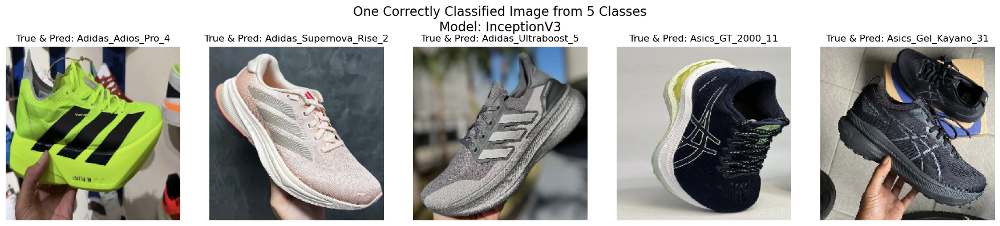

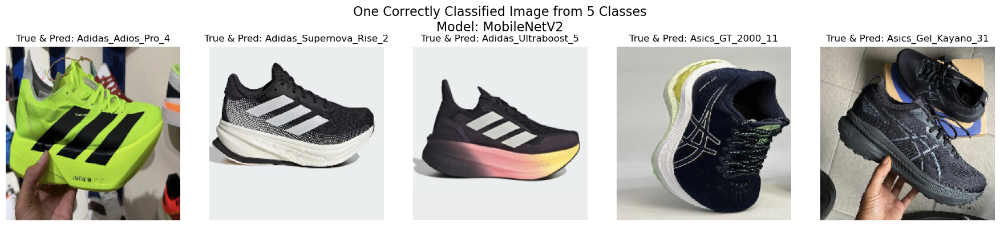

In [25]:
# For InceptionV3
plot_correctly_classified_per_class(test_images, test_true_labels, pred_labels_inception, class_names, model_name="InceptionV3")

# For MobileNetV2
plot_correctly_classified_per_class(test_images, test_true_labels, pred_labels_mobilenet, class_names, model_name="MobileNetV2")


### Correctly Classified Image Analysis

#### InceptionV3 and MobileNetV2 Models

This visualization highlights one correctly classified image from five different sneaker classes for both the InceptionV3 and MobileNetV2 models. The results demonstrate that both models are capable of strong performance under favorable conditions.

#### Observations:

- **Consistently Correct Across Models**:
  - `Adidas_Adios_Pro_4`, `Adidas_Supernova_Rise_2`, `Adidas_Ultraboost_5`, `Asics_GT_2000_11`, and `Asics_Gel_Kayano_31` were correctly classified by both models.
  - This consistency suggests that these models possess **highly distinctive visual features**—such as bold branding, unique midsole designs, or signature colorways—that are well-captured by the convolutional layers.

- **Possible Contributing Factors**:
  - These classes may be **well-represented in the training set**, allowing the models to generalize more effectively.
  - High-quality or **consistent image angles and lighting** might also make it easier for the models to extract robust features for classification.


- The ability of both models to correctly identify the same set of sneaker models reinforces the importance of:
  - **Strong, class-distinctive visual features**
  - **Balanced and diverse training data**
  - **High-quality imagery**

When these conditions are met, both InceptionV3 and MobileNetV2 can deliver **reliable performance** in fine-grained sneaker classification tasks.

These results also provide a reference point for understanding which sneaker classes the models are most confident with—and where to focus improvement efforts for less consistently recognized categories.


### Summary & Recommendations

- Both InceptionV3 and MobileNetV2 models are challenged by **fine-grained classification**, particularly when dealing with sneakers that have **subtle visual differences** or **design similarities across brands**.
- Common patterns of **cross-brand misclassification** (e.g., Adidas → Hoka, Asics → Hoka) and **intra-brand confusion** (e.g., Nike models being confused with each other) indicate that CNN-based models may struggle to separate fine details, especially when shoes share materials, textures, or silhouettes.

---

#### Model Strengths & Weaknesses

| Model         | Strengths                                                                 | Weaknesses                                                                 |
|---------------|---------------------------------------------------------------------------|----------------------------------------------------------------------------|
| **InceptionV3** | - Strong results on visually distinct sneaker types.<br>- Slightly better generalization on diverse inputs. | - Larger and slower to train.<br>- Can confuse similar-looking models across brands. |
| **MobileNetV2** | - Lightweight and fast.<br>- Performs well on common sneaker types.<br>- More practical for real-time use. | - May miss subtle details between similar models.<br>- Slightly more confusion within the same brand. |

---

#### Recommendations:

- **Augment the Data**: Apply random transformations like rotation, brightness changes, and zoom to increase variety and help generalization.
- **Balance the Dataset**: Ensure each sneaker class has enough samples to avoid bias and overfitting.

- **Training Strategy**:
  - Start by training only the top (classification) layers with the base model frozen.
  - Once validation accuracy plateaus, unfreeze deeper layers and fine-tune with a lower learning rate.
  - Use a learning rate scheduler (e.g., reduce LR on plateau) to maintain stable learning.
  - Suggested starting point: learning rate of `0.0001`, lowered to `0.00001` during fine-tuning.

---

With a better data pipeline and a more strategic training approach, both models can be made more robust and accurate—even on visually similar sneaker models.
